In [1]:
%%capture
!pip install numpy tqdm matplotlib torch torchvision

In [2]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset
import numpy as np
from PIL import Image
import os

In [3]:

# Parameters
images_per_class = 4000  # Number of images per class
resize_to = (64, 64)  # Target size
output_dir = "./cifar10_resized_shuffled"  # Output folder

transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize the image if needed
    transforms.ToTensor()    # Convert the image to a tensor
    #transforms.Normalize((0.5,), (0.5,))  # Normalize the image
])

In [4]:
cifar10 = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


100%|██████████| 170498071/170498071 [00:11<00:00, 14656517.16it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data


In [5]:
# Group images by class
class_indices = {i: [] for i in range(10)}  # A dictionary to hold indices of each class
for idx, (_, label) in enumerate(cifar10):
    class_indices[label].append(idx)

In [6]:
selected_indices = []
for class_id, indices in class_indices.items():
    selected_indices.extend(np.random.choice(indices, images_per_class, replace=False))


In [7]:
np.random.shuffle(selected_indices)

# Subset the dataset
subset_dataset = Subset(cifar10, selected_indices)

In [8]:
# Create a DataLoader
batch_size = 128
dataloader = DataLoader(
    subset_dataset, batch_size=batch_size, shuffle=True, num_workers=2
)


In [9]:
os.makedirs(output_dir, exist_ok=True)

In [10]:
os.makedirs('./images', exist_ok=True)
os.makedirs('./weights', exist_ok=True)

In [11]:
from torchvision.transforms import ToPILImage

# Save all images without class labels
for idx in range(len(subset_dataset)):
    img, _ = subset_dataset[idx]  # Get the image (Tensor) and label (we discard the label)
    img_pil = transforms.ToPILImage()(img)  # Convert tensor to PIL image
    img_pil.save(os.path.join(output_dir, f"image_{idx}.png"))  # Save image

print(f"Shuffled, resized images saved in {output_dir} (20,000 images total).")

Shuffled, resized images saved in ./cifar10_resized_shuffled (20,000 images total).


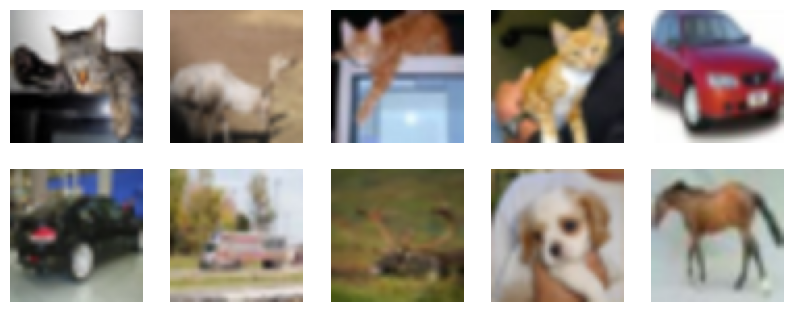

In [12]:
image_files = sorted(os.listdir(output_dir))
import matplotlib.pyplot as plt
# Display the first 10 images
plt.figure(figsize=(10, 10))
for i, img_file in enumerate(image_files[:10]):  # Adjust the range to display more/less images
    img = Image.open(os.path.join(output_dir, img_file))
    plt.subplot(5, 5, i + 1)  # Change grid size as needed
    plt.imshow(img)
    plt.axis('off')
plt.show()

In [13]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as tv_data
import torchvision.transforms as transforms
import torchvision.utils as vutils
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

In [14]:
current_device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(current_device)

cuda


In [15]:
ngpu = 1   # number of GPUs 
nz = 100   #dimensionality of the noise vector

# initialises the weights of the neural network for stable training
def weights_normal_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:    
        # initialises weights with normal distribution with mean=0, standard deviation=0.02 to prevent exploding/vanishing gradients
        m.weight.data.normal_(0.0, 0.02)    
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(0.0, 0.02)
        # sets the bias of this layer=0 so that they adjust later on without any prior intervention
        m.bias.data.fill_(0)

class Disc_model(nn.Module):
    def __init__(self, ngpu):
        super(Disc_model, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(num_channels, 64, 4, 2, 1, bias=False),  #kernel=4*4, stride=2, padding=1
            nn.LeakyReLU(0.2, inplace=True),   #alpha=0.2
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        output = self.main(input)
        return output.view(-1, 1).squeeze(1)


In [16]:
class Gen_model(nn.Module):
    def __init__(self, ngpu):
        super(Gen_model, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, num_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        
    def forward(self, input):
        output = self.main(input)
        return output


In [17]:
fixed_noise = torch.randn(128, nz, 1, 1).to(current_device)
real_label = 1
fake_label = 0

niter = 25
g_loss = []
d_loss = []


In [18]:
num_channels=3
model_Gen = Gen_model(ngpu).to(current_device)
model_Gen.apply(weights_normal_init)
model_Disc = Disc_model(ngpu).to(current_device)
model_Disc.apply(weights_normal_init)
loss_func = nn.BCELoss()


In [19]:
optimizerD = optim.Adam(model_Disc.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = optim.Adam(model_Gen.parameters(), lr=0.0002, betas=(0.5, 0.999))


  0%|          | 0/25 [00:00<?, ?it/s]

[0/25][0/313] Loss_D: 1.3921 Loss_G: 0.7153 D(x): 0.4984 D(G(z)): 0.5013 / 0.4890
saving the output
[0/25][1/313] Loss_D: 1.3574 Loss_G: 0.7091 D(x): 0.5183 D(G(z)): 0.5035 / 0.4921
[0/25][2/313] Loss_D: 1.3327 Loss_G: 0.7092 D(x): 0.5343 D(G(z)): 0.5062 / 0.4921
[0/25][3/313] Loss_D: 1.3021 Loss_G: 0.7157 D(x): 0.5530 D(G(z)): 0.5080 / 0.4888
[0/25][4/313] Loss_D: 1.2744 Loss_G: 0.7324 D(x): 0.5674 D(G(z)): 0.5069 / 0.4808
[0/25][5/313] Loss_D: 1.2319 Loss_G: 0.7572 D(x): 0.5866 D(G(z)): 0.5023 / 0.4690
[0/25][6/313] Loss_D: 1.1902 Loss_G: 0.7942 D(x): 0.6033 D(G(z)): 0.4952 / 0.4519
[0/25][7/313] Loss_D: 1.1246 Loss_G: 0.8529 D(x): 0.6244 D(G(z)): 0.4794 / 0.4262
[0/25][8/313] Loss_D: 1.0552 Loss_G: 0.9300 D(x): 0.6359 D(G(z)): 0.4518 / 0.3945
[0/25][9/313] Loss_D: 0.9612 Loss_G: 1.0165 D(x): 0.6564 D(G(z)): 0.4167 / 0.3619
[0/25][10/313] Loss_D: 0.8671 Loss_G: 1.1050 D(x): 0.6769 D(G(z)): 0.3786 / 0.3312
[0/25][11/313] Loss_D: 0.7863 Loss_G: 1.1869 D(x): 0.6961 D(G(z)): 0.3450 / 0.3

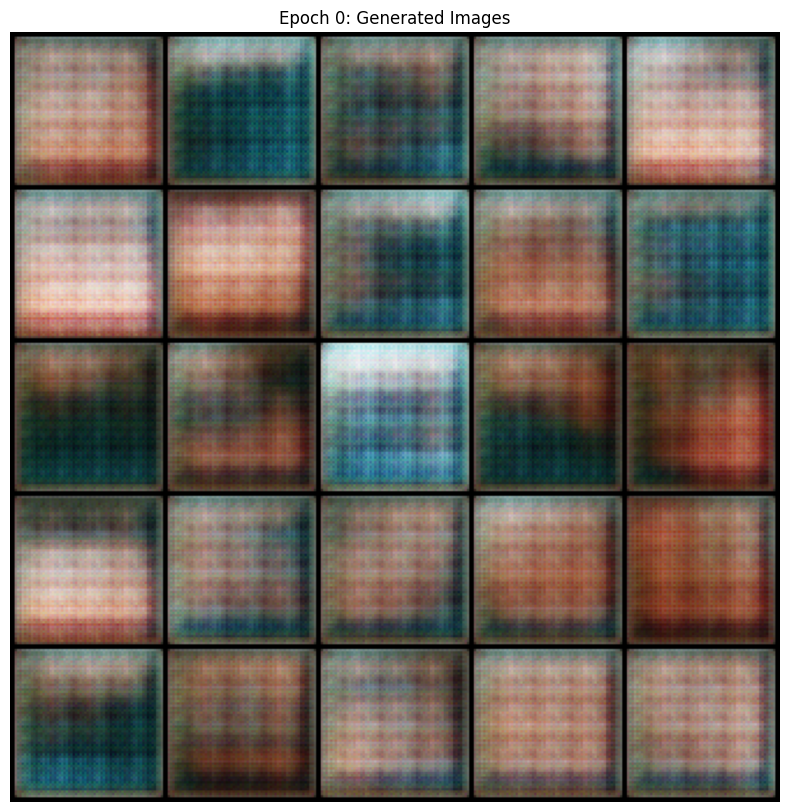

  4%|▍         | 1/25 [01:02<25:11, 62.96s/it]

[1/25][0/313] Loss_D: 0.9388 Loss_G: 2.3678 D(x): 0.6538 D(G(z)): 0.3916 / 0.0963
saving the output
[1/25][1/313] Loss_D: 1.0918 Loss_G: 1.5109 D(x): 0.4405 D(G(z)): 0.2107 / 0.2277
[1/25][2/313] Loss_D: 0.9562 Loss_G: 1.3518 D(x): 0.6217 D(G(z)): 0.3669 / 0.2702
[1/25][3/313] Loss_D: 0.8497 Loss_G: 1.7561 D(x): 0.6962 D(G(z)): 0.3684 / 0.1874
[1/25][4/313] Loss_D: 0.6099 Loss_G: 2.0882 D(x): 0.7536 D(G(z)): 0.2627 / 0.1400
[1/25][5/313] Loss_D: 0.4693 Loss_G: 2.2452 D(x): 0.8104 D(G(z)): 0.2114 / 0.1242
[1/25][6/313] Loss_D: 0.5411 Loss_G: 2.0469 D(x): 0.7733 D(G(z)): 0.2121 / 0.1563
[1/25][7/313] Loss_D: 1.0182 Loss_G: 2.9993 D(x): 0.8549 D(G(z)): 0.5094 / 0.0553
[1/25][8/313] Loss_D: 0.9981 Loss_G: 1.7480 D(x): 0.4867 D(G(z)): 0.1646 / 0.1921
[1/25][9/313] Loss_D: 1.3393 Loss_G: 0.9813 D(x): 0.5925 D(G(z)): 0.5222 / 0.3934
[1/25][10/313] Loss_D: 1.2096 Loss_G: 1.5327 D(x): 0.6481 D(G(z)): 0.4955 / 0.2323
[1/25][11/313] Loss_D: 0.7541 Loss_G: 1.9010 D(x): 0.7014 D(G(z)): 0.3016 / 0.1

  8%|▊         | 2/25 [02:08<24:36, 64.20s/it]

[1/25][311/313] Loss_D: 1.3356 Loss_G: 0.8080 D(x): 0.4767 D(G(z)): 0.4149 / 0.4618
[1/25][312/313] Loss_D: 1.2338 Loss_G: 1.5841 D(x): 0.6995 D(G(z)): 0.5633 / 0.2144
[2/25][0/313] Loss_D: 1.0372 Loss_G: 1.4498 D(x): 0.5542 D(G(z)): 0.3388 / 0.2438
saving the output
[2/25][1/313] Loss_D: 0.9313 Loss_G: 1.2248 D(x): 0.5871 D(G(z)): 0.3126 / 0.3149
[2/25][2/313] Loss_D: 0.9508 Loss_G: 1.8648 D(x): 0.7474 D(G(z)): 0.4588 / 0.1646
[2/25][3/313] Loss_D: 0.8273 Loss_G: 1.5732 D(x): 0.5912 D(G(z)): 0.2431 / 0.2165
[2/25][4/313] Loss_D: 0.7798 Loss_G: 1.4401 D(x): 0.6895 D(G(z)): 0.3210 / 0.2467
[2/25][5/313] Loss_D: 1.0561 Loss_G: 1.6507 D(x): 0.6315 D(G(z)): 0.4294 / 0.2038
[2/25][6/313] Loss_D: 1.1092 Loss_G: 1.8042 D(x): 0.5832 D(G(z)): 0.4135 / 0.1764
[2/25][7/313] Loss_D: 1.2439 Loss_G: 1.3738 D(x): 0.5246 D(G(z)): 0.4182 / 0.2688
[2/25][8/313] Loss_D: 1.3967 Loss_G: 1.5111 D(x): 0.5359 D(G(z)): 0.5100 / 0.2383
[2/25][9/313] Loss_D: 1.0775 Loss_G: 1.3727 D(x): 0.5581 D(G(z)): 0.3628 / 0

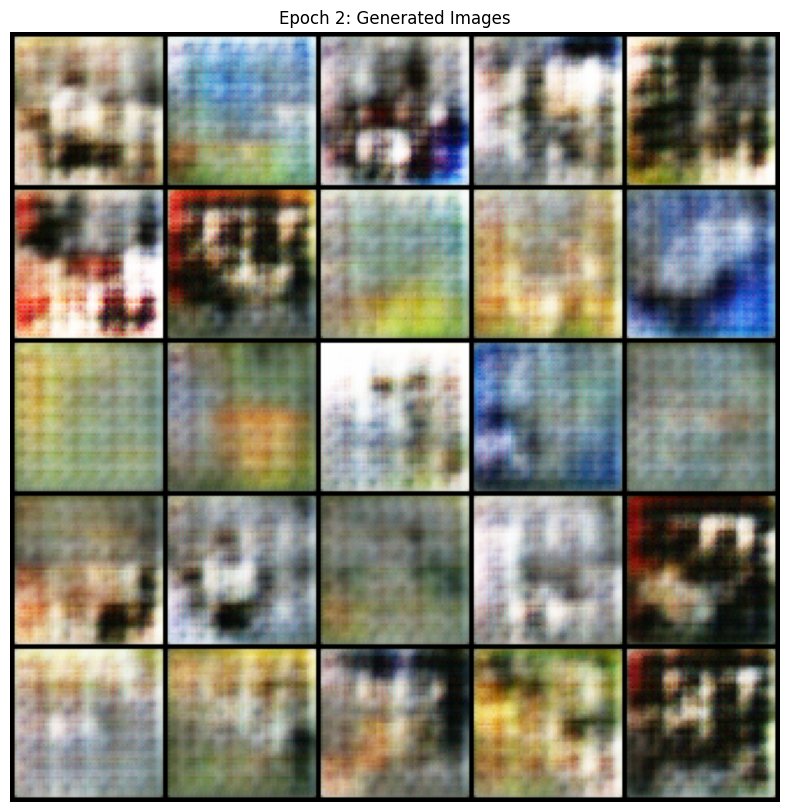

 12%|█▏        | 3/25 [03:15<24:07, 65.78s/it]

[3/25][0/313] Loss_D: 1.0195 Loss_G: 1.4869 D(x): 0.6090 D(G(z)): 0.3824 / 0.2385
saving the output
[3/25][1/313] Loss_D: 0.9189 Loss_G: 1.5273 D(x): 0.6450 D(G(z)): 0.3569 / 0.2298
[3/25][2/313] Loss_D: 0.8928 Loss_G: 1.7294 D(x): 0.6625 D(G(z)): 0.3628 / 0.1909
[3/25][3/313] Loss_D: 0.8193 Loss_G: 1.6864 D(x): 0.6687 D(G(z)): 0.3225 / 0.2017
[3/25][4/313] Loss_D: 0.8682 Loss_G: 1.6515 D(x): 0.6592 D(G(z)): 0.3420 / 0.2127
[3/25][5/313] Loss_D: 0.8576 Loss_G: 1.6785 D(x): 0.6739 D(G(z)): 0.3492 / 0.2025
[3/25][6/313] Loss_D: 0.8765 Loss_G: 1.6146 D(x): 0.6547 D(G(z)): 0.3307 / 0.2233
[3/25][7/313] Loss_D: 0.9750 Loss_G: 2.0769 D(x): 0.7055 D(G(z)): 0.4337 / 0.1434
[3/25][8/313] Loss_D: 1.0599 Loss_G: 0.9602 D(x): 0.4860 D(G(z)): 0.2359 / 0.4126
[3/25][9/313] Loss_D: 1.3445 Loss_G: 2.6221 D(x): 0.7746 D(G(z)): 0.6302 / 0.0812
[3/25][10/313] Loss_D: 1.2825 Loss_G: 1.3681 D(x): 0.3493 D(G(z)): 0.1219 / 0.2786
[3/25][11/313] Loss_D: 0.9478 Loss_G: 1.2834 D(x): 0.6920 D(G(z)): 0.4070 / 0.3

 16%|█▌        | 4/25 [04:22<23:10, 66.22s/it]

[3/25][311/313] Loss_D: 0.9297 Loss_G: 1.6702 D(x): 0.6469 D(G(z)): 0.3665 / 0.2008
[3/25][312/313] Loss_D: 0.9643 Loss_G: 1.3825 D(x): 0.5974 D(G(z)): 0.3304 / 0.2662
[4/25][0/313] Loss_D: 1.0484 Loss_G: 1.5614 D(x): 0.6594 D(G(z)): 0.4428 / 0.2270
saving the output
[4/25][1/313] Loss_D: 1.1083 Loss_G: 1.6095 D(x): 0.6011 D(G(z)): 0.4178 / 0.2133
[4/25][2/313] Loss_D: 1.2671 Loss_G: 1.2819 D(x): 0.5070 D(G(z)): 0.4090 / 0.2942
[4/25][3/313] Loss_D: 1.3112 Loss_G: 1.3629 D(x): 0.5235 D(G(z)): 0.4524 / 0.2713
[4/25][4/313] Loss_D: 1.0925 Loss_G: 1.6245 D(x): 0.6133 D(G(z)): 0.4283 / 0.2090
[4/25][5/313] Loss_D: 0.8577 Loss_G: 1.2797 D(x): 0.6011 D(G(z)): 0.2728 / 0.2980
[4/25][6/313] Loss_D: 1.0174 Loss_G: 1.8992 D(x): 0.7525 D(G(z)): 0.4987 / 0.1623
[4/25][7/313] Loss_D: 0.9594 Loss_G: 1.1850 D(x): 0.5273 D(G(z)): 0.2420 / 0.3238
[4/25][8/313] Loss_D: 1.1171 Loss_G: 1.7601 D(x): 0.7216 D(G(z)): 0.5187 / 0.1921
[4/25][9/313] Loss_D: 1.0380 Loss_G: 1.1050 D(x): 0.4972 D(G(z)): 0.2519 / 0

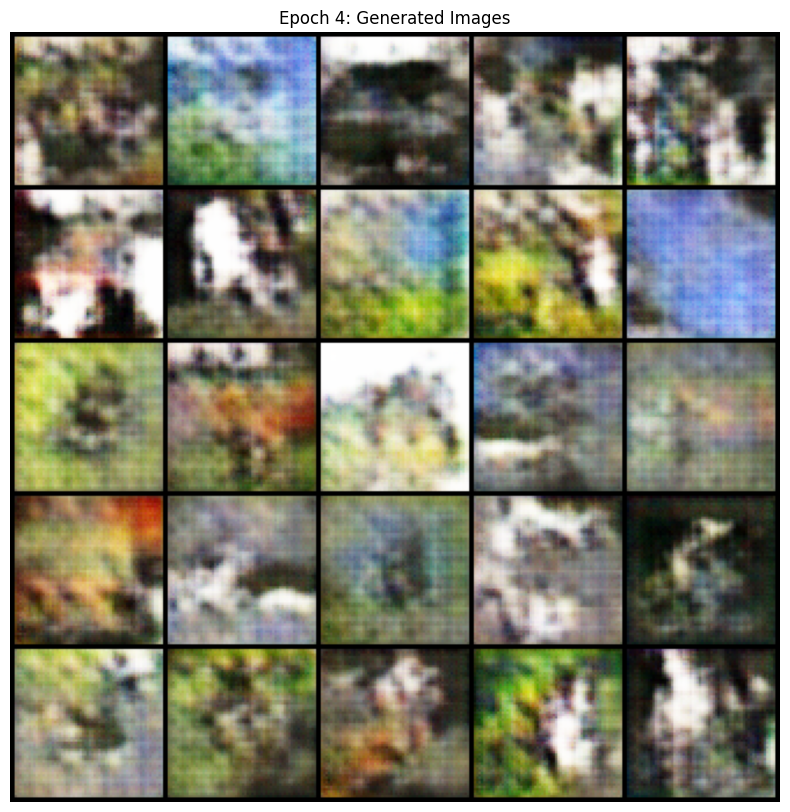

 20%|██        | 5/25 [05:30<22:14, 66.70s/it]

[5/25][0/313] Loss_D: 0.9906 Loss_G: 1.8396 D(x): 0.7626 D(G(z)): 0.4876 / 0.1760
saving the output
[5/25][1/313] Loss_D: 0.9541 Loss_G: 1.5324 D(x): 0.5768 D(G(z)): 0.2977 / 0.2374
[5/25][2/313] Loss_D: 0.9656 Loss_G: 1.3527 D(x): 0.6232 D(G(z)): 0.3551 / 0.2837
[5/25][3/313] Loss_D: 0.9312 Loss_G: 1.9130 D(x): 0.7088 D(G(z)): 0.4172 / 0.1669
[5/25][4/313] Loss_D: 1.0767 Loss_G: 0.9570 D(x): 0.4896 D(G(z)): 0.2534 / 0.4176
[5/25][5/313] Loss_D: 1.1436 Loss_G: 2.3615 D(x): 0.8052 D(G(z)): 0.5755 / 0.1047
[5/25][6/313] Loss_D: 1.3084 Loss_G: 0.8852 D(x): 0.3458 D(G(z)): 0.1673 / 0.4405
[5/25][7/313] Loss_D: 1.0792 Loss_G: 1.5784 D(x): 0.7531 D(G(z)): 0.5236 / 0.2252
[5/25][8/313] Loss_D: 0.9584 Loss_G: 1.6230 D(x): 0.6108 D(G(z)): 0.3434 / 0.2173
[5/25][9/313] Loss_D: 0.8466 Loss_G: 1.5141 D(x): 0.6605 D(G(z)): 0.3255 / 0.2427
[5/25][10/313] Loss_D: 0.9216 Loss_G: 1.3574 D(x): 0.6340 D(G(z)): 0.3408 / 0.2804
[5/25][11/313] Loss_D: 0.8583 Loss_G: 1.5215 D(x): 0.6589 D(G(z)): 0.3324 / 0.2

 24%|██▍       | 6/25 [06:36<21:08, 66.75s/it]

[5/25][311/313] Loss_D: 1.0148 Loss_G: 2.0789 D(x): 0.7602 D(G(z)): 0.5009 / 0.1365
[5/25][312/313] Loss_D: 1.4432 Loss_G: 0.4310 D(x): 0.3330 D(G(z)): 0.2086 / 0.6598
[6/25][0/313] Loss_D: 1.8157 Loss_G: 3.2476 D(x): 0.8672 D(G(z)): 0.7876 / 0.0435
saving the output
[6/25][1/313] Loss_D: 2.1453 Loss_G: 0.7833 D(x): 0.1424 D(G(z)): 0.0685 / 0.4860
[6/25][2/313] Loss_D: 1.2934 Loss_G: 0.9804 D(x): 0.6819 D(G(z)): 0.5624 / 0.4006
[6/25][3/313] Loss_D: 1.4056 Loss_G: 1.5274 D(x): 0.5662 D(G(z)): 0.5331 / 0.2349
[6/25][4/313] Loss_D: 1.0756 Loss_G: 1.1871 D(x): 0.5137 D(G(z)): 0.3019 / 0.3217
[6/25][5/313] Loss_D: 1.0632 Loss_G: 1.1077 D(x): 0.6064 D(G(z)): 0.4017 / 0.3456
[6/25][6/313] Loss_D: 0.9513 Loss_G: 1.4178 D(x): 0.6922 D(G(z)): 0.4169 / 0.2587
[6/25][7/313] Loss_D: 0.9488 Loss_G: 1.3457 D(x): 0.6277 D(G(z)): 0.3568 / 0.2811
[6/25][8/313] Loss_D: 0.9821 Loss_G: 1.2789 D(x): 0.6296 D(G(z)): 0.3751 / 0.2973
[6/25][9/313] Loss_D: 0.9737 Loss_G: 1.4993 D(x): 0.6769 D(G(z)): 0.4192 / 0

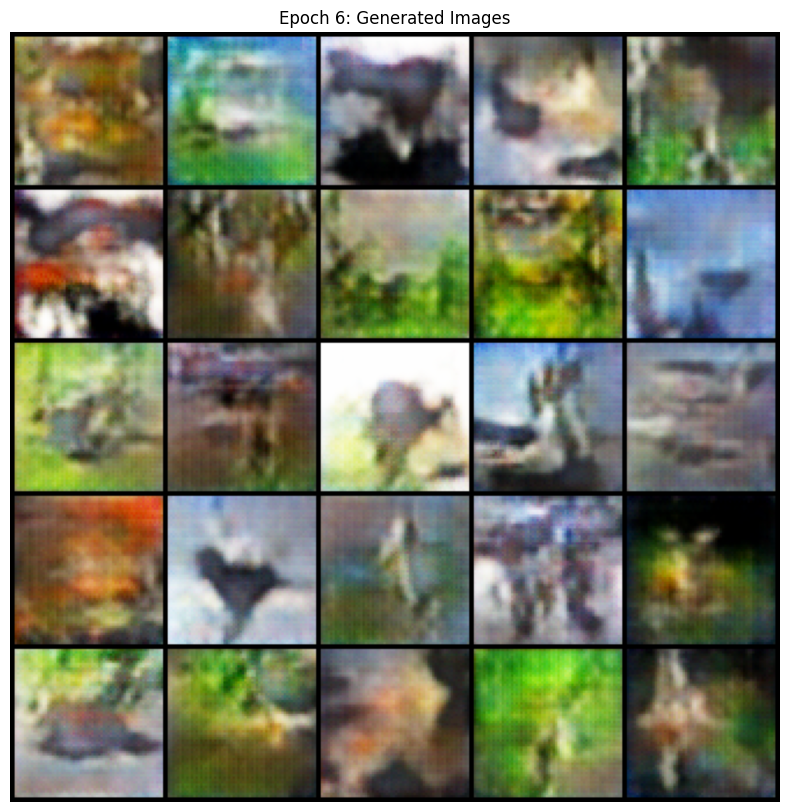

 28%|██▊       | 7/25 [07:44<20:06, 67.05s/it]

[7/25][0/313] Loss_D: 1.1278 Loss_G: 1.2049 D(x): 0.5437 D(G(z)): 0.3752 / 0.3182
saving the output
[7/25][1/313] Loss_D: 1.2039 Loss_G: 1.4646 D(x): 0.5642 D(G(z)): 0.4312 / 0.2498
[7/25][2/313] Loss_D: 0.8378 Loss_G: 1.0699 D(x): 0.6257 D(G(z)): 0.2844 / 0.3588
[7/25][3/313] Loss_D: 0.9328 Loss_G: 1.9061 D(x): 0.7403 D(G(z)): 0.4461 / 0.1608
[7/25][4/313] Loss_D: 0.9157 Loss_G: 1.0895 D(x): 0.5502 D(G(z)): 0.2416 / 0.3539
[7/25][5/313] Loss_D: 1.0458 Loss_G: 1.9597 D(x): 0.7669 D(G(z)): 0.5208 / 0.1486
[7/25][6/313] Loss_D: 0.9382 Loss_G: 1.0467 D(x): 0.5103 D(G(z)): 0.2031 / 0.3691
[7/25][7/313] Loss_D: 1.0818 Loss_G: 1.6108 D(x): 0.7175 D(G(z)): 0.5029 / 0.2159
[7/25][8/313] Loss_D: 1.1143 Loss_G: 0.8956 D(x): 0.5026 D(G(z)): 0.3163 / 0.4228
[7/25][9/313] Loss_D: 1.2111 Loss_G: 2.2239 D(x): 0.7187 D(G(z)): 0.5660 / 0.1179
[7/25][10/313] Loss_D: 1.3119 Loss_G: 0.6693 D(x): 0.3454 D(G(z)): 0.1590 / 0.5292
[7/25][11/313] Loss_D: 1.3115 Loss_G: 1.8885 D(x): 0.8103 D(G(z)): 0.6478 / 0.1

 32%|███▏      | 8/25 [08:51<18:59, 67.02s/it]

[7/25][311/313] Loss_D: 0.9483 Loss_G: 1.0853 D(x): 0.5436 D(G(z)): 0.2603 / 0.3546
[7/25][312/313] Loss_D: 1.0061 Loss_G: 1.4562 D(x): 0.7006 D(G(z)): 0.4563 / 0.2465
[8/25][0/313] Loss_D: 0.9125 Loss_G: 1.2462 D(x): 0.6109 D(G(z)): 0.3195 / 0.3034
saving the output
[8/25][1/313] Loss_D: 0.8854 Loss_G: 1.5539 D(x): 0.7084 D(G(z)): 0.3979 / 0.2264
[8/25][2/313] Loss_D: 0.8066 Loss_G: 1.5408 D(x): 0.6709 D(G(z)): 0.3178 / 0.2267
[8/25][3/313] Loss_D: 0.7858 Loss_G: 1.1760 D(x): 0.6450 D(G(z)): 0.2768 / 0.3225
[8/25][4/313] Loss_D: 0.7916 Loss_G: 2.0985 D(x): 0.7910 D(G(z)): 0.4112 / 0.1320
[8/25][5/313] Loss_D: 0.8610 Loss_G: 0.8359 D(x): 0.5127 D(G(z)): 0.1473 / 0.4489
[8/25][6/313] Loss_D: 1.2095 Loss_G: 2.9170 D(x): 0.8820 D(G(z)): 0.6428 / 0.0602
[8/25][7/313] Loss_D: 1.5786 Loss_G: 0.8287 D(x): 0.2446 D(G(z)): 0.0915 / 0.4549
[8/25][8/313] Loss_D: 1.1079 Loss_G: 2.3032 D(x): 0.8119 D(G(z)): 0.5699 / 0.1106
[8/25][9/313] Loss_D: 1.2229 Loss_G: 0.5472 D(x): 0.3833 D(G(z)): 0.1864 / 0

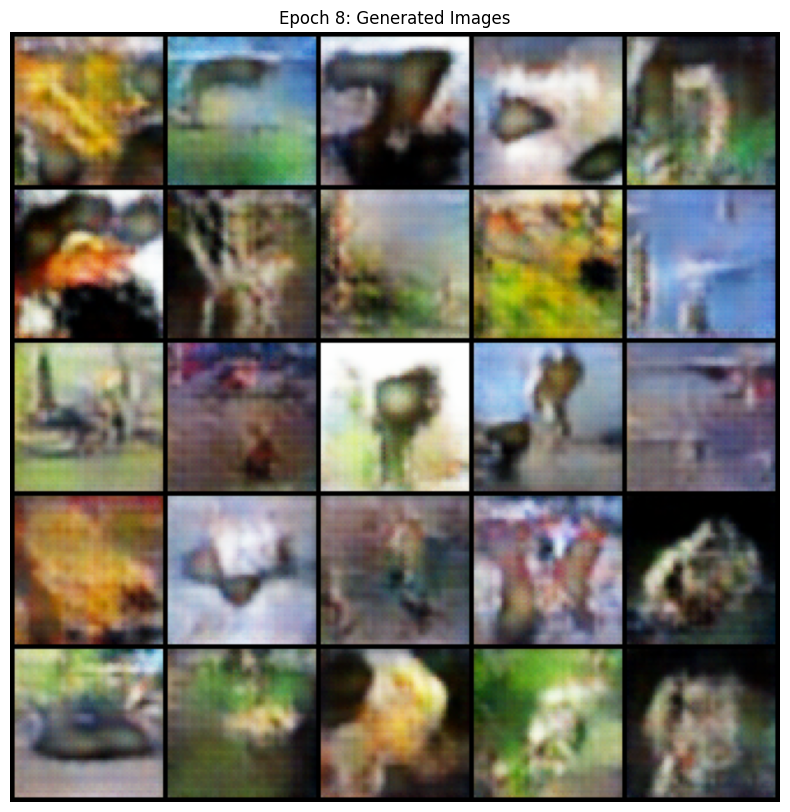

 36%|███▌      | 9/25 [09:59<17:54, 67.18s/it]

[9/25][0/313] Loss_D: 1.3753 Loss_G: 0.8180 D(x): 0.3699 D(G(z)): 0.2244 / 0.4707
saving the output
[9/25][1/313] Loss_D: 1.2387 Loss_G: 2.3298 D(x): 0.7939 D(G(z)): 0.6023 / 0.1108
[9/25][2/313] Loss_D: 1.1485 Loss_G: 1.1916 D(x): 0.4461 D(G(z)): 0.2305 / 0.3218
[9/25][3/313] Loss_D: 0.8426 Loss_G: 1.7936 D(x): 0.7569 D(G(z)): 0.4085 / 0.1827
[9/25][4/313] Loss_D: 0.6908 Loss_G: 1.9177 D(x): 0.7263 D(G(z)): 0.2896 / 0.1646
[9/25][5/313] Loss_D: 0.7522 Loss_G: 1.3546 D(x): 0.6721 D(G(z)): 0.2731 / 0.2771
[9/25][6/313] Loss_D: 0.8164 Loss_G: 1.9612 D(x): 0.7700 D(G(z)): 0.3979 / 0.1595
[9/25][7/313] Loss_D: 0.6849 Loss_G: 1.5825 D(x): 0.6690 D(G(z)): 0.2237 / 0.2201
[9/25][8/313] Loss_D: 0.7102 Loss_G: 1.8031 D(x): 0.7544 D(G(z)): 0.3312 / 0.1796
[9/25][9/313] Loss_D: 0.7645 Loss_G: 1.5601 D(x): 0.6871 D(G(z)): 0.2979 / 0.2241
[9/25][10/313] Loss_D: 0.7902 Loss_G: 1.2967 D(x): 0.6603 D(G(z)): 0.2899 / 0.2926
[9/25][11/313] Loss_D: 0.7803 Loss_G: 3.1485 D(x): 0.8426 D(G(z)): 0.4373 / 0.0

 40%|████      | 10/25 [11:06<16:46, 67.10s/it]

[9/25][311/313] Loss_D: 1.1371 Loss_G: 2.6869 D(x): 0.9291 D(G(z)): 0.6284 / 0.0768
[9/25][312/313] Loss_D: 1.2660 Loss_G: 0.9900 D(x): 0.3494 D(G(z)): 0.1455 / 0.4069
[10/25][0/313] Loss_D: 0.9900 Loss_G: 1.5343 D(x): 0.7890 D(G(z)): 0.5051 / 0.2337
saving the output
[10/25][1/313] Loss_D: 0.9155 Loss_G: 1.7966 D(x): 0.6653 D(G(z)): 0.3707 / 0.1786
[10/25][2/313] Loss_D: 0.8635 Loss_G: 1.4519 D(x): 0.6207 D(G(z)): 0.2933 / 0.2545
[10/25][3/313] Loss_D: 0.7385 Loss_G: 1.8205 D(x): 0.7747 D(G(z)): 0.3614 / 0.1772
[10/25][4/313] Loss_D: 0.7623 Loss_G: 1.4371 D(x): 0.6564 D(G(z)): 0.2680 / 0.2533
[10/25][5/313] Loss_D: 0.6686 Loss_G: 1.8895 D(x): 0.7839 D(G(z)): 0.3274 / 0.1661
[10/25][6/313] Loss_D: 0.5621 Loss_G: 1.9250 D(x): 0.7575 D(G(z)): 0.2363 / 0.1589
[10/25][7/313] Loss_D: 0.6347 Loss_G: 1.4119 D(x): 0.7051 D(G(z)): 0.2306 / 0.2603
[10/25][8/313] Loss_D: 0.5590 Loss_G: 2.1756 D(x): 0.8403 D(G(z)): 0.3043 / 0.1268
[10/25][9/313] Loss_D: 0.5214 Loss_G: 1.7640 D(x): 0.7122 D(G(z)): 

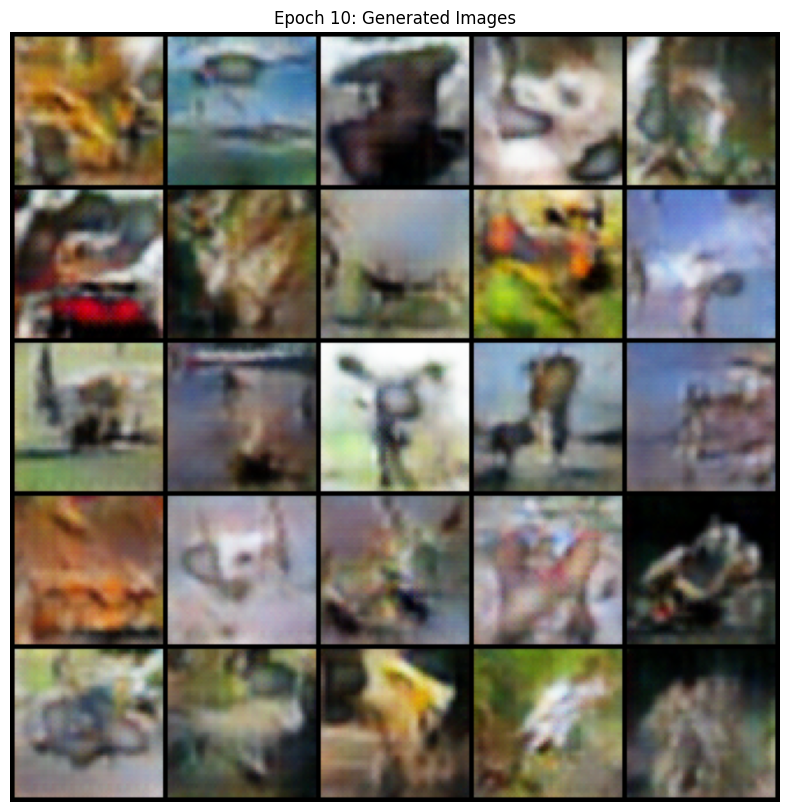

 44%|████▍     | 11/25 [12:13<15:41, 67.26s/it]

[11/25][0/313] Loss_D: 0.7930 Loss_G: 1.5672 D(x): 0.6892 D(G(z)): 0.3229 / 0.2241
saving the output
[11/25][1/313] Loss_D: 0.6995 Loss_G: 1.5393 D(x): 0.7115 D(G(z)): 0.2800 / 0.2362
[11/25][2/313] Loss_D: 0.8030 Loss_G: 1.7613 D(x): 0.7363 D(G(z)): 0.3706 / 0.1855
[11/25][3/313] Loss_D: 0.6676 Loss_G: 1.6015 D(x): 0.6646 D(G(z)): 0.2056 / 0.2215
[11/25][4/313] Loss_D: 0.6540 Loss_G: 2.4311 D(x): 0.8607 D(G(z)): 0.3816 / 0.0970
[11/25][5/313] Loss_D: 0.7020 Loss_G: 1.5896 D(x): 0.5888 D(G(z)): 0.1326 / 0.2243
[11/25][6/313] Loss_D: 0.6231 Loss_G: 2.4327 D(x): 0.8889 D(G(z)): 0.3794 / 0.0988
[11/25][7/313] Loss_D: 0.7775 Loss_G: 1.1683 D(x): 0.5862 D(G(z)): 0.1931 / 0.3372
[11/25][8/313] Loss_D: 0.7990 Loss_G: 3.2617 D(x): 0.9308 D(G(z)): 0.4957 / 0.0433
[11/25][9/313] Loss_D: 1.0224 Loss_G: 1.6359 D(x): 0.4125 D(G(z)): 0.0761 / 0.2178
[11/25][10/313] Loss_D: 0.5759 Loss_G: 2.5753 D(x): 0.9066 D(G(z)): 0.3631 / 0.0851
[11/25][11/313] Loss_D: 0.9905 Loss_G: 0.8922 D(x): 0.5073 D(G(z)): 

 48%|████▊     | 12/25 [13:20<14:33, 67.18s/it]

[11/25][311/313] Loss_D: 1.3933 Loss_G: 0.9258 D(x): 0.3529 D(G(z)): 0.2407 / 0.4156
[11/25][312/313] Loss_D: 1.3734 Loss_G: 0.9783 D(x): 0.5852 D(G(z)): 0.5364 / 0.3911
[12/25][0/313] Loss_D: 1.2227 Loss_G: 1.5792 D(x): 0.6546 D(G(z)): 0.5259 / 0.2201
saving the output
[12/25][1/313] Loss_D: 1.1294 Loss_G: 1.0662 D(x): 0.4709 D(G(z)): 0.2833 / 0.3609
[12/25][2/313] Loss_D: 0.9953 Loss_G: 1.1933 D(x): 0.6627 D(G(z)): 0.4204 / 0.3204
[12/25][3/313] Loss_D: 0.9585 Loss_G: 1.5793 D(x): 0.6638 D(G(z)): 0.3997 / 0.2227
[12/25][4/313] Loss_D: 0.7821 Loss_G: 1.5373 D(x): 0.6597 D(G(z)): 0.2843 / 0.2363
[12/25][5/313] Loss_D: 0.8748 Loss_G: 1.5039 D(x): 0.6671 D(G(z)): 0.3494 / 0.2451
[12/25][6/313] Loss_D: 0.8119 Loss_G: 1.5518 D(x): 0.6864 D(G(z)): 0.3311 / 0.2338
[12/25][7/313] Loss_D: 0.9180 Loss_G: 1.4222 D(x): 0.6406 D(G(z)): 0.3530 / 0.2597
[12/25][8/313] Loss_D: 0.8608 Loss_G: 1.4854 D(x): 0.6671 D(G(z)): 0.3369 / 0.2454
[12/25][9/313] Loss_D: 0.6863 Loss_G: 1.6277 D(x): 0.7342 D(G(z))

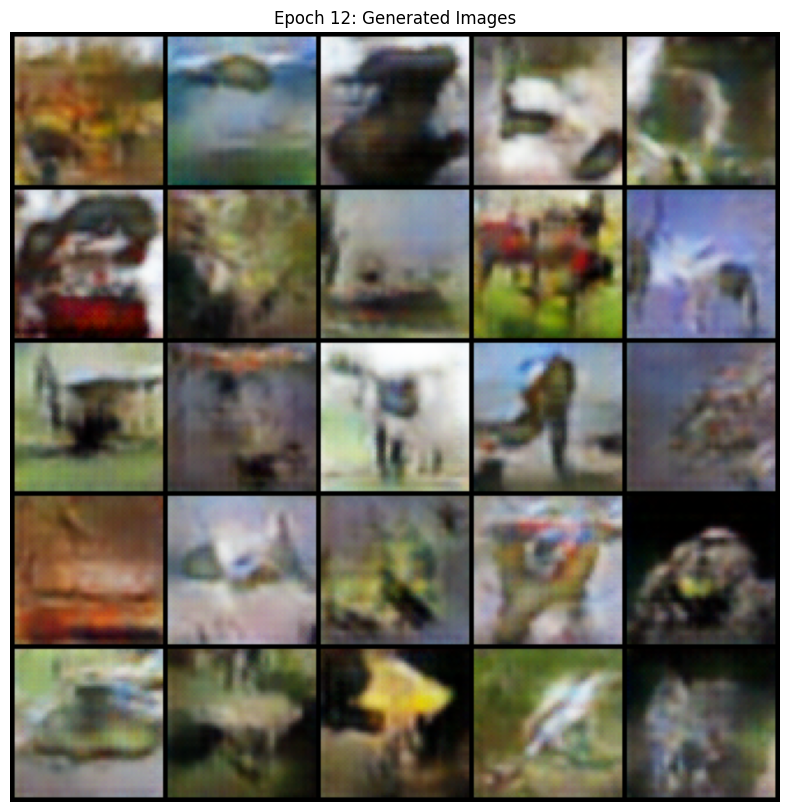

 52%|█████▏    | 13/25 [14:28<13:27, 67.30s/it]

[13/25][0/313] Loss_D: 0.9918 Loss_G: 1.3784 D(x): 0.6428 D(G(z)): 0.3990 / 0.2717
saving the output
[13/25][1/313] Loss_D: 0.9897 Loss_G: 1.4569 D(x): 0.6315 D(G(z)): 0.3832 / 0.2516
[13/25][2/313] Loss_D: 0.9099 Loss_G: 1.1587 D(x): 0.6050 D(G(z)): 0.3122 / 0.3327
[13/25][3/313] Loss_D: 0.9273 Loss_G: 1.7712 D(x): 0.7152 D(G(z)): 0.4243 / 0.1847
[13/25][4/313] Loss_D: 0.9333 Loss_G: 1.3366 D(x): 0.5834 D(G(z)): 0.2917 / 0.2820
[13/25][5/313] Loss_D: 0.8545 Loss_G: 1.5491 D(x): 0.7094 D(G(z)): 0.3804 / 0.2271
[13/25][6/313] Loss_D: 0.8295 Loss_G: 1.5523 D(x): 0.6759 D(G(z)): 0.3329 / 0.2296
[13/25][7/313] Loss_D: 0.7970 Loss_G: 1.8965 D(x): 0.7349 D(G(z)): 0.3681 / 0.1634
[13/25][8/313] Loss_D: 0.8371 Loss_G: 1.3475 D(x): 0.6076 D(G(z)): 0.2538 / 0.2832
[13/25][9/313] Loss_D: 0.7240 Loss_G: 2.2883 D(x): 0.8274 D(G(z)): 0.3925 / 0.1129
[13/25][10/313] Loss_D: 0.7210 Loss_G: 1.4059 D(x): 0.6202 D(G(z)): 0.1904 / 0.2628
[13/25][11/313] Loss_D: 0.6829 Loss_G: 2.5287 D(x): 0.8572 D(G(z)): 

 56%|█████▌    | 14/25 [15:35<12:18, 67.18s/it]

[13/25][311/313] Loss_D: 1.0582 Loss_G: 1.0404 D(x): 0.5616 D(G(z)): 0.3522 / 0.3754
[13/25][312/313] Loss_D: 1.0115 Loss_G: 1.3115 D(x): 0.6492 D(G(z)): 0.4177 / 0.2864
[14/25][0/313] Loss_D: 0.9435 Loss_G: 1.3757 D(x): 0.6619 D(G(z)): 0.3904 / 0.2722
saving the output
[14/25][1/313] Loss_D: 0.8342 Loss_G: 1.3991 D(x): 0.6528 D(G(z)): 0.3117 / 0.2681
[14/25][2/313] Loss_D: 0.9412 Loss_G: 1.1893 D(x): 0.6260 D(G(z)): 0.3535 / 0.3231
[14/25][3/313] Loss_D: 1.0231 Loss_G: 1.5187 D(x): 0.7035 D(G(z)): 0.4604 / 0.2404
[14/25][4/313] Loss_D: 0.9286 Loss_G: 1.3667 D(x): 0.6120 D(G(z)): 0.3262 / 0.2700
[14/25][5/313] Loss_D: 1.0071 Loss_G: 1.1619 D(x): 0.5975 D(G(z)): 0.3598 / 0.3322
[14/25][6/313] Loss_D: 0.8709 Loss_G: 1.4795 D(x): 0.7009 D(G(z)): 0.3797 / 0.2434
[14/25][7/313] Loss_D: 0.8033 Loss_G: 1.4376 D(x): 0.6568 D(G(z)): 0.3009 / 0.2537
[14/25][8/313] Loss_D: 0.8183 Loss_G: 1.4859 D(x): 0.7092 D(G(z)): 0.3569 / 0.2450
[14/25][9/313] Loss_D: 0.8084 Loss_G: 1.3407 D(x): 0.6516 D(G(z))

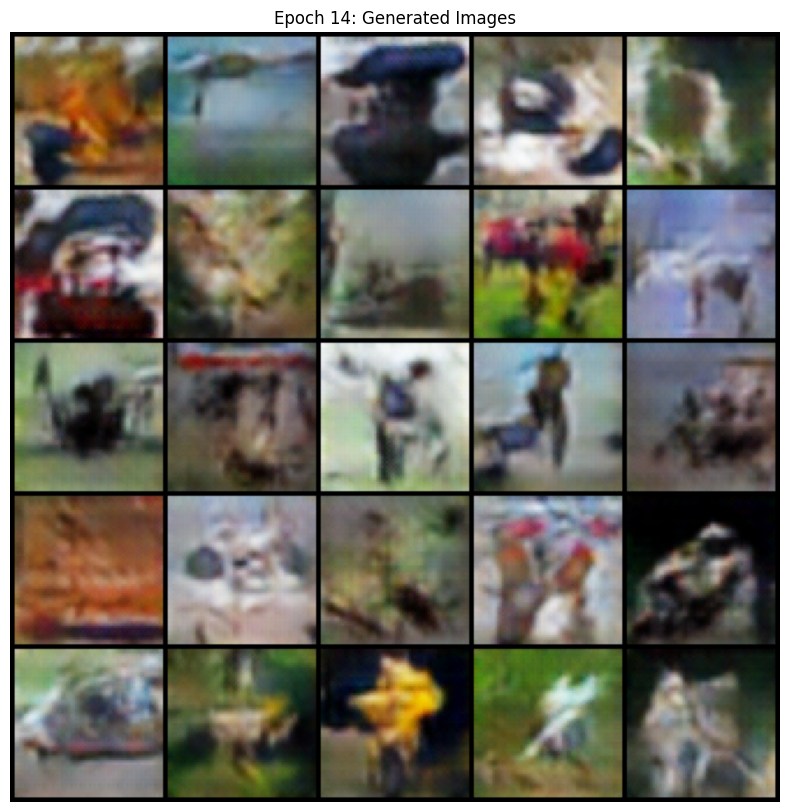

 60%|██████    | 15/25 [16:42<11:13, 67.32s/it]

[15/25][0/313] Loss_D: 0.9624 Loss_G: 1.3110 D(x): 0.6264 D(G(z)): 0.3635 / 0.2874
saving the output
[15/25][1/313] Loss_D: 0.8492 Loss_G: 1.5397 D(x): 0.6879 D(G(z)): 0.3558 / 0.2290
[15/25][2/313] Loss_D: 0.9667 Loss_G: 1.4391 D(x): 0.6397 D(G(z)): 0.3821 / 0.2501
[15/25][3/313] Loss_D: 0.9701 Loss_G: 1.2142 D(x): 0.6044 D(G(z)): 0.3416 / 0.3154
[15/25][4/313] Loss_D: 0.8644 Loss_G: 1.3446 D(x): 0.6765 D(G(z)): 0.3539 / 0.2776
[15/25][5/313] Loss_D: 0.8995 Loss_G: 1.5385 D(x): 0.6763 D(G(z)): 0.3789 / 0.2276
[15/25][6/313] Loss_D: 0.9353 Loss_G: 1.3710 D(x): 0.6316 D(G(z)): 0.3549 / 0.2707
[15/25][7/313] Loss_D: 0.8756 Loss_G: 1.2877 D(x): 0.6426 D(G(z)): 0.3335 / 0.2942
[15/25][8/313] Loss_D: 0.7763 Loss_G: 1.8182 D(x): 0.7576 D(G(z)): 0.3757 / 0.1789
[15/25][9/313] Loss_D: 0.8504 Loss_G: 1.1604 D(x): 0.5851 D(G(z)): 0.2412 / 0.3359
[15/25][10/313] Loss_D: 0.8689 Loss_G: 2.0748 D(x): 0.7974 D(G(z)): 0.4501 / 0.1413
[15/25][11/313] Loss_D: 0.8553 Loss_G: 1.1187 D(x): 0.5577 D(G(z)): 

 64%|██████▍   | 16/25 [17:49<10:05, 67.24s/it]

[15/25][311/313] Loss_D: 1.3581 Loss_G: 0.2109 D(x): 0.3097 D(G(z)): 0.0957 / 0.8262
[15/25][312/313] Loss_D: 2.0304 Loss_G: 4.2822 D(x): 0.9888 D(G(z)): 0.8441 / 0.0160
[16/25][0/313] Loss_D: 2.0716 Loss_G: 1.6430 D(x): 0.1467 D(G(z)): 0.0358 / 0.2229
saving the output
[16/25][1/313] Loss_D: 0.9155 Loss_G: 0.6797 D(x): 0.5987 D(G(z)): 0.2987 / 0.5424
[16/25][2/313] Loss_D: 1.2303 Loss_G: 1.6106 D(x): 0.8679 D(G(z)): 0.6380 / 0.2171
[16/25][3/313] Loss_D: 0.8465 Loss_G: 1.7476 D(x): 0.5839 D(G(z)): 0.2338 / 0.1969
[16/25][4/313] Loss_D: 0.8459 Loss_G: 1.1404 D(x): 0.5921 D(G(z)): 0.2461 / 0.3422
[16/25][5/313] Loss_D: 0.8649 Loss_G: 1.4610 D(x): 0.8040 D(G(z)): 0.4559 / 0.2500
[16/25][6/313] Loss_D: 0.9746 Loss_G: 1.5343 D(x): 0.6585 D(G(z)): 0.4013 / 0.2354
[16/25][7/313] Loss_D: 0.8936 Loss_G: 1.1925 D(x): 0.5582 D(G(z)): 0.2360 / 0.3302
[16/25][8/313] Loss_D: 1.0013 Loss_G: 1.4894 D(x): 0.7339 D(G(z)): 0.4652 / 0.2493
[16/25][9/313] Loss_D: 0.8559 Loss_G: 1.8740 D(x): 0.7053 D(G(z))

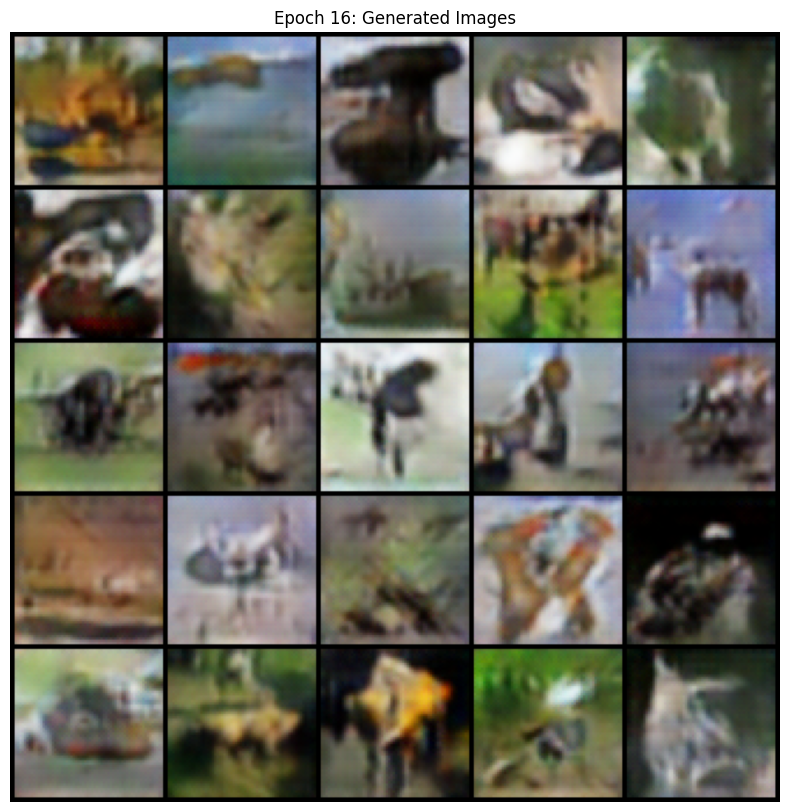

 68%|██████▊   | 17/25 [18:57<08:58, 67.36s/it]

[17/25][0/313] Loss_D: 0.9055 Loss_G: 4.7510 D(x): 0.9587 D(G(z)): 0.5454 / 0.0106
saving the output
[17/25][1/313] Loss_D: 2.1767 Loss_G: 1.1182 D(x): 0.1442 D(G(z)): 0.0245 / 0.3677
[17/25][2/313] Loss_D: 0.7385 Loss_G: 2.7267 D(x): 0.9467 D(G(z)): 0.4722 / 0.0734
[17/25][3/313] Loss_D: 0.8098 Loss_G: 1.2332 D(x): 0.5223 D(G(z)): 0.1018 / 0.3204
[17/25][4/313] Loss_D: 0.8087 Loss_G: 2.2946 D(x): 0.8646 D(G(z)): 0.4618 / 0.1116
[17/25][5/313] Loss_D: 0.5217 Loss_G: 2.1038 D(x): 0.7431 D(G(z)): 0.1855 / 0.1355
[17/25][6/313] Loss_D: 0.5493 Loss_G: 1.8007 D(x): 0.7625 D(G(z)): 0.2243 / 0.1881
[17/25][7/313] Loss_D: 0.4597 Loss_G: 2.7499 D(x): 0.9128 D(G(z)): 0.2930 / 0.0737
[17/25][8/313] Loss_D: 0.4235 Loss_G: 2.1710 D(x): 0.7707 D(G(z)): 0.1372 / 0.1290
[17/25][9/313] Loss_D: 0.4688 Loss_G: 2.0949 D(x): 0.8384 D(G(z)): 0.2426 / 0.1346
[17/25][10/313] Loss_D: 0.4491 Loss_G: 3.0383 D(x): 0.8480 D(G(z)): 0.2362 / 0.0574
[17/25][11/313] Loss_D: 0.4877 Loss_G: 1.3052 D(x): 0.6912 D(G(z)): 

 72%|███████▏  | 18/25 [20:04<07:51, 67.29s/it]

[17/25][311/313] Loss_D: 3.3394 Loss_G: 1.3802 D(x): 0.0504 D(G(z)): 0.0192 / 0.2907
[17/25][312/313] Loss_D: 1.2056 Loss_G: 0.2909 D(x): 0.4940 D(G(z)): 0.3213 / 0.7546
[18/25][0/313] Loss_D: 1.8367 Loss_G: 1.4209 D(x): 0.8732 D(G(z)): 0.7976 / 0.2661
saving the output
[18/25][1/313] Loss_D: 0.9957 Loss_G: 1.7122 D(x): 0.5380 D(G(z)): 0.2747 / 0.1959
[18/25][2/313] Loss_D: 1.2114 Loss_G: 0.7661 D(x): 0.4338 D(G(z)): 0.2621 / 0.4870
[18/25][3/313] Loss_D: 1.1114 Loss_G: 1.1201 D(x): 0.7195 D(G(z)): 0.5172 / 0.3473
[18/25][4/313] Loss_D: 1.0796 Loss_G: 1.3352 D(x): 0.6180 D(G(z)): 0.4266 / 0.2815
[18/25][5/313] Loss_D: 1.0416 Loss_G: 1.1835 D(x): 0.5616 D(G(z)): 0.3432 / 0.3269
[18/25][6/313] Loss_D: 1.1576 Loss_G: 1.0203 D(x): 0.5721 D(G(z)): 0.4216 / 0.3818
[18/25][7/313] Loss_D: 1.2175 Loss_G: 1.0126 D(x): 0.5607 D(G(z)): 0.4437 / 0.3804
[18/25][8/313] Loss_D: 1.1741 Loss_G: 1.0847 D(x): 0.5621 D(G(z)): 0.4241 / 0.3564
[18/25][9/313] Loss_D: 1.0780 Loss_G: 1.2703 D(x): 0.6263 D(G(z))

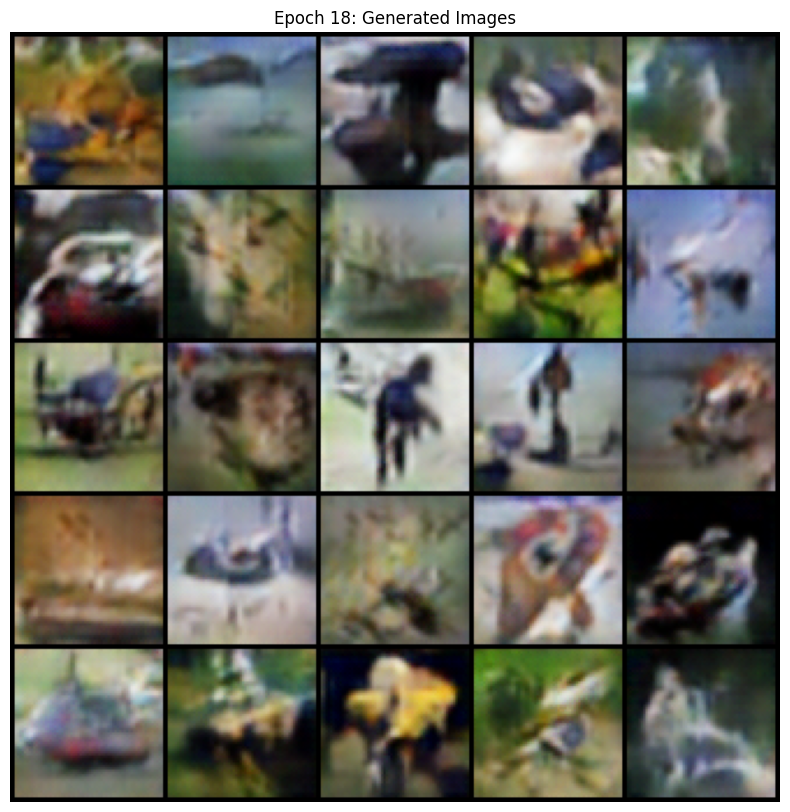

 76%|███████▌  | 19/25 [21:12<06:44, 67.43s/it]

[19/25][0/313] Loss_D: 0.3480 Loss_G: 1.5611 D(x): 0.8388 D(G(z)): 0.1510 / 0.2301
saving the output
[19/25][1/313] Loss_D: 0.9073 Loss_G: 5.4050 D(x): 0.9732 D(G(z)): 0.5619 / 0.0052
[19/25][2/313] Loss_D: 3.4258 Loss_G: 2.3816 D(x): 0.0433 D(G(z)): 0.0069 / 0.1067
[19/25][3/313] Loss_D: 0.8912 Loss_G: 0.2366 D(x): 0.5185 D(G(z)): 0.1615 / 0.7959
[19/25][4/313] Loss_D: 1.8213 Loss_G: 2.8918 D(x): 0.9740 D(G(z)): 0.8053 / 0.0667
[19/25][5/313] Loss_D: 0.6701 Loss_G: 2.1670 D(x): 0.5968 D(G(z)): 0.1107 / 0.1345
[19/25][6/313] Loss_D: 0.6722 Loss_G: 1.1743 D(x): 0.6876 D(G(z)): 0.2310 / 0.3356
[19/25][7/313] Loss_D: 0.6717 Loss_G: 2.2184 D(x): 0.8788 D(G(z)): 0.3949 / 0.1248
[19/25][8/313] Loss_D: 0.4975 Loss_G: 2.0857 D(x): 0.7536 D(G(z)): 0.1763 / 0.1400
[19/25][9/313] Loss_D: 0.4131 Loss_G: 2.3429 D(x): 0.8804 D(G(z)): 0.2399 / 0.1074
[19/25][10/313] Loss_D: 0.4379 Loss_G: 2.4040 D(x): 0.8321 D(G(z)): 0.2139 / 0.1032
[19/25][11/313] Loss_D: 0.3990 Loss_G: 2.5576 D(x): 0.8068 D(G(z)): 

 80%|████████  | 20/25 [22:19<05:36, 67.32s/it]

[19/25][311/313] Loss_D: 1.2044 Loss_G: 1.4469 D(x): 0.7734 D(G(z)): 0.5867 / 0.2526
[19/25][312/313] Loss_D: 1.3313 Loss_G: 1.1424 D(x): 0.4667 D(G(z)): 0.3970 / 0.3327
[20/25][0/313] Loss_D: 1.1347 Loss_G: 0.9127 D(x): 0.5328 D(G(z)): 0.3641 / 0.4284
saving the output
[20/25][1/313] Loss_D: 1.0691 Loss_G: 1.3906 D(x): 0.6706 D(G(z)): 0.4624 / 0.2691
[20/25][2/313] Loss_D: 1.1689 Loss_G: 0.9612 D(x): 0.4844 D(G(z)): 0.3273 / 0.4060
[20/25][3/313] Loss_D: 1.2270 Loss_G: 1.3623 D(x): 0.6645 D(G(z)): 0.5298 / 0.2753
[20/25][4/313] Loss_D: 1.1675 Loss_G: 1.0457 D(x): 0.4840 D(G(z)): 0.3196 / 0.3699
[20/25][5/313] Loss_D: 1.0936 Loss_G: 1.1217 D(x): 0.6226 D(G(z)): 0.4363 / 0.3466
[20/25][6/313] Loss_D: 1.1614 Loss_G: 1.3019 D(x): 0.6030 D(G(z)): 0.4466 / 0.2945
[20/25][7/313] Loss_D: 1.0696 Loss_G: 1.1291 D(x): 0.5576 D(G(z)): 0.3514 / 0.3507
[20/25][8/313] Loss_D: 1.0290 Loss_G: 1.2393 D(x): 0.6422 D(G(z)): 0.4167 / 0.3133
[20/25][9/313] Loss_D: 1.0294 Loss_G: 1.5582 D(x): 0.6416 D(G(z))

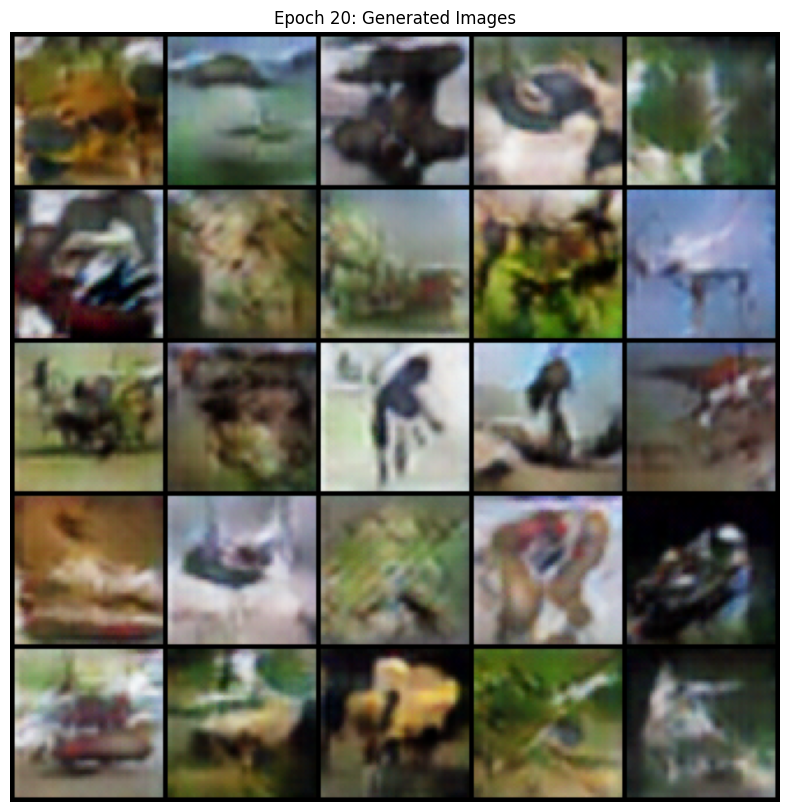

 84%|████████▍ | 21/25 [23:27<04:29, 67.42s/it]

[21/25][0/313] Loss_D: 0.7875 Loss_G: 1.3382 D(x): 0.6542 D(G(z)): 0.2723 / 0.2907
saving the output
[21/25][1/313] Loss_D: 0.7935 Loss_G: 1.4611 D(x): 0.7125 D(G(z)): 0.3420 / 0.2558
[21/25][2/313] Loss_D: 0.8177 Loss_G: 1.7202 D(x): 0.7120 D(G(z)): 0.3504 / 0.1993
[21/25][3/313] Loss_D: 0.6723 Loss_G: 1.5015 D(x): 0.6835 D(G(z)): 0.2220 / 0.2479
[21/25][4/313] Loss_D: 0.7590 Loss_G: 2.2641 D(x): 0.8018 D(G(z)): 0.3926 / 0.1188
[21/25][5/313] Loss_D: 0.6545 Loss_G: 1.5857 D(x): 0.6155 D(G(z)): 0.1220 / 0.2341
[21/25][6/313] Loss_D: 0.7065 Loss_G: 2.0580 D(x): 0.8498 D(G(z)): 0.3974 / 0.1478
[21/25][7/313] Loss_D: 0.5926 Loss_G: 1.8847 D(x): 0.7097 D(G(z)): 0.2027 / 0.1732
[21/25][8/313] Loss_D: 0.5658 Loss_G: 1.6050 D(x): 0.7560 D(G(z)): 0.2302 / 0.2226
[21/25][9/313] Loss_D: 0.5203 Loss_G: 2.4634 D(x): 0.8824 D(G(z)): 0.3080 / 0.1013
[21/25][10/313] Loss_D: 0.5746 Loss_G: 1.6128 D(x): 0.6831 D(G(z)): 0.1502 / 0.2214
[21/25][11/313] Loss_D: 0.6581 Loss_G: 2.2695 D(x): 0.8471 D(G(z)): 

 88%|████████▊ | 22/25 [24:34<03:21, 67.33s/it]

[21/25][311/313] Loss_D: 0.5674 Loss_G: 1.9449 D(x): 0.7935 D(G(z)): 0.2668 / 0.1595
[21/25][312/313] Loss_D: 0.4360 Loss_G: 2.1909 D(x): 0.8008 D(G(z)): 0.1810 / 0.1335
[22/25][0/313] Loss_D: 0.4878 Loss_G: 2.1716 D(x): 0.8166 D(G(z)): 0.2347 / 0.1314
saving the output
[22/25][1/313] Loss_D: 0.4828 Loss_G: 1.8144 D(x): 0.7713 D(G(z)): 0.1837 / 0.1842
[22/25][2/313] Loss_D: 0.4553 Loss_G: 3.0092 D(x): 0.8758 D(G(z)): 0.2633 / 0.0569
[22/25][3/313] Loss_D: 0.4157 Loss_G: 2.1484 D(x): 0.7603 D(G(z)): 0.1178 / 0.1364
[22/25][4/313] Loss_D: 0.3538 Loss_G: 3.0386 D(x): 0.9380 D(G(z)): 0.2397 / 0.0573
[22/25][5/313] Loss_D: 0.4573 Loss_G: 2.1652 D(x): 0.7035 D(G(z)): 0.0788 / 0.1353
[22/25][6/313] Loss_D: 0.5339 Loss_G: 3.8545 D(x): 0.9525 D(G(z)): 0.3637 / 0.0250
[22/25][7/313] Loss_D: 0.7196 Loss_G: 2.6526 D(x): 0.5329 D(G(z)): 0.0409 / 0.0850
[22/25][8/313] Loss_D: 0.3542 Loss_G: 1.7454 D(x): 0.8686 D(G(z)): 0.1808 / 0.1956
[22/25][9/313] Loss_D: 0.7968 Loss_G: 4.1858 D(x): 0.8681 D(G(z))

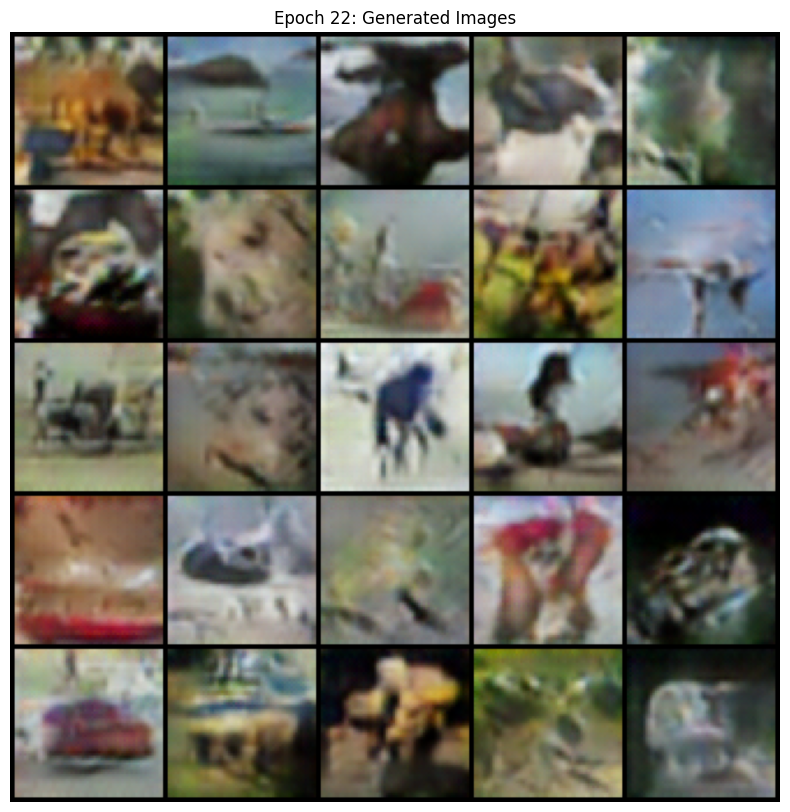

 92%|█████████▏| 23/25 [25:42<02:14, 67.47s/it]

[23/25][0/313] Loss_D: 0.5747 Loss_G: 1.2492 D(x): 0.6610 D(G(z)): 0.1260 / 0.3186
saving the output
[23/25][1/313] Loss_D: 2.0057 Loss_G: 6.8408 D(x): 0.9982 D(G(z)): 0.8222 / 0.0013
[23/25][2/313] Loss_D: 5.5865 Loss_G: 2.5504 D(x): 0.0052 D(G(z)): 0.0016 / 0.1087
[23/25][3/313] Loss_D: 2.1891 Loss_G: 0.1075 D(x): 0.1879 D(G(z)): 0.1513 / 0.9005
[23/25][4/313] Loss_D: 2.8865 Loss_G: 0.5904 D(x): 0.9213 D(G(z)): 0.9148 / 0.5754
[23/25][5/313] Loss_D: 1.2724 Loss_G: 2.4029 D(x): 0.7440 D(G(z)): 0.5779 / 0.1047
[23/25][6/313] Loss_D: 1.6756 Loss_G: 1.1388 D(x): 0.2404 D(G(z)): 0.1360 / 0.3536
[23/25][7/313] Loss_D: 1.0811 Loss_G: 0.6821 D(x): 0.5845 D(G(z)): 0.3785 / 0.5256
[23/25][8/313] Loss_D: 1.2511 Loss_G: 1.2000 D(x): 0.7386 D(G(z)): 0.5763 / 0.3245
[23/25][9/313] Loss_D: 0.9525 Loss_G: 1.5256 D(x): 0.6256 D(G(z)): 0.3451 / 0.2365
[23/25][10/313] Loss_D: 1.0823 Loss_G: 1.0390 D(x): 0.5260 D(G(z)): 0.3245 / 0.3717
[23/25][11/313] Loss_D: 1.0197 Loss_G: 1.1132 D(x): 0.6534 D(G(z)): 

 96%|█████████▌| 24/25 [26:49<01:07, 67.32s/it]

[23/25][311/313] Loss_D: 0.6449 Loss_G: 1.7971 D(x): 0.8507 D(G(z)): 0.3628 / 0.1821
[23/25][312/313] Loss_D: 0.8209 Loss_G: 1.6450 D(x): 0.6766 D(G(z)): 0.3139 / 0.2202
[24/25][0/313] Loss_D: 0.8423 Loss_G: 2.8702 D(x): 0.7939 D(G(z)): 0.4349 / 0.0647
saving the output
[24/25][1/313] Loss_D: 1.1809 Loss_G: 1.1276 D(x): 0.3831 D(G(z)): 0.1189 / 0.3504
[24/25][2/313] Loss_D: 0.7334 Loss_G: 3.5935 D(x): 0.9790 D(G(z)): 0.4791 / 0.0327
[24/25][3/313] Loss_D: 1.6948 Loss_G: 0.7922 D(x): 0.2179 D(G(z)): 0.0464 / 0.4817
[24/25][4/313] Loss_D: 1.0117 Loss_G: 2.3315 D(x): 0.9528 D(G(z)): 0.5870 / 0.1131
[24/25][5/313] Loss_D: 0.5750 Loss_G: 1.9279 D(x): 0.6838 D(G(z)): 0.1572 / 0.1650
[24/25][6/313] Loss_D: 0.5238 Loss_G: 1.6433 D(x): 0.8078 D(G(z)): 0.2533 / 0.2127
[24/25][7/313] Loss_D: 0.6072 Loss_G: 2.4522 D(x): 0.8433 D(G(z)): 0.3341 / 0.0998
[24/25][8/313] Loss_D: 0.6899 Loss_G: 1.3535 D(x): 0.6510 D(G(z)): 0.2067 / 0.2821
[24/25][9/313] Loss_D: 0.8154 Loss_G: 3.2380 D(x): 0.8355 D(G(z))

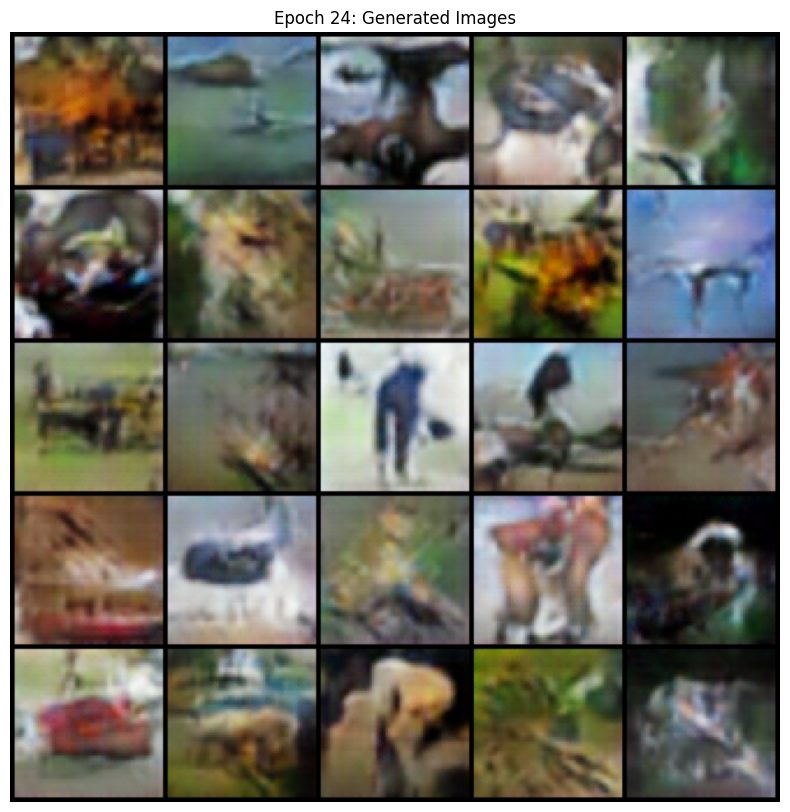

100%|██████████| 25/25 [27:56<00:00, 67.07s/it]


In [20]:
for epoch in tqdm(range(niter), total = niter):
    for i, data in enumerate(dataloader, 0):
        model_Disc.zero_grad()
        device_model = data[0].to(current_device)
        batch_size = device_model.size(0)
        label = torch.full((batch_size,), real_label).to(current_device)

        output = model_Disc(device_model) # Discriminator output
        disc_error_real = loss_func(output.float(), label.float())
        disc_error_real.backward() # disc loss for real image
        D_x = output.mean().item()

        noise = torch.randn(batch_size, nz, 1, 1).to(current_device) # create noise
        fake = model_Gen(noise) # Fake image
        label.fill_(fake_label) # Fill with 0
        output = model_Disc(fake.detach())
        disc_error_fake = loss_func(output.float(), label.float()) # disc loss for fake image
        disc_error_fake.backward()
        D_G_z1 = output.mean().item()
        disc_error = disc_error_real + disc_error_fake
        optimizerD.step()

        model_Gen.zero_grad()
        label.fill_(real_label) # fill with 1
        output = model_Disc(fake.float()) # disc output
        gen_error = loss_func(output.float(), label.float())
        gen_error.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        print(f'[{epoch}/{niter}][{i}/{len(dataloader)}] Loss_D: {disc_error.item():.4f} Loss_G: {gen_error.item():.4f} D(x): {D_x:.4f} D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}')

        if i % 100 == 0: # save images every 100 steps
            print('saving the output')
            vutils.save_image(device_model,'./images/real_samples.png',normalize=True)
            fake = model_Gen(fixed_noise)
            vutils.save_image(fake.detach(),'./images/fake_samples_epoch_%03d.png' % (epoch),normalize=True)
    # Save images every 2 epochs
    if epoch % 2 == 0:
        with torch.no_grad():
            fixed_fake = model_Gen(fixed_noise).detach().cpu()
        grid = vutils.make_grid(fixed_fake[:25], nrow=5)  # Arrange 25 images in a grid (5x5)
        
        # Display the grid using matplotlib
        plt.figure(figsize=(10, 10))
        plt.axis("off")
        plt.title(f"Epoch {epoch}: Generated Images")
        plt.imshow(grid.permute(1, 2, 0))  # Change dimensions from (C, H, W) to (H, W, C)
        plt.show()
        
    torch.save(model_Gen.state_dict(), 'weights/model_Gen_epoch_%d.pth' % (epoch))
    torch.save(model_Disc.state_dict(), 'weights/model_Disc_epoch_%d.pth' % (epoch))
